<center> <img src="https://d3i71xaburhd42.cloudfront.net/261c3e30bae8b8bdc83541ffa9331b52fcf015e6/3-Figure2-1.png" width=20% > </center>

# <center> Assignment 1: Photometric Stereo & Colour </center>
<center> Computer Vision 1 University of Amsterdam </center>
<center> Due 23:59PM, September 16, 2023 (Amsterdam time) </center>
<center> <b>TA's: Ozzy Ülger, Egoitz Gonzalez, Sina Taslimi</b></center>
    
***

Student1 ID: 13181017 \
Student1 Name: Juell Sprott

Student2 ID: 15164640 \
Student2 Name: Mina Janicijevic

Student3 ID: \
Student3 Name:

( Student4 ID: \
Student4 Name: )


# General guidelines


Your code and discussion must be handed in this jupyter notebook, renamed to **StudentID1_StudentID2_StudentID3.ipynb** before the deadline by submitting it to the Canvas Lab 1 Assignment. Please also fill out your names and ID's above.

For full credit, make sure your notebook follows these guidelines:
- It is mandatory to use the Python environment provided with the assignment; the environment specifies the package versions that have to be used to prevent the use of particular functions. Using different packages versions may lead to grade deduction. In the 'Environment Setup' below you can check whether your environment is set up correctly.
- To install the environment with the right package versions, use the following command in your terminal: ```python
conda env create --file=environment.yaml```, then activate the environment using the command ```python conda activate cv1```.
- Please express your thoughts concisely. The number of words does not necessarily correlate with how well you understand the concepts.
- Answer all given questions and sub-questions.
- Try to understand the problem as much as you can. When answering a question, give evidences (qualitative and/or quantitative results, references to papers, figures etc.) to support your arguments. Note that not everything might be explicitly asked for and you are expected to think about what might strengthen you arguments and make the notebook self-contained and complete.
- Tables and figures must be accompanied by a brief description. Do not forget to add a number, a title, and if applicable name and unit of variables in a table, name and unit of axes and legends in a figure.

__Note:__ A more complete overview of the lab requirements can be found in the Course Manual on Canvas

Late submissions are not allowed. Assignments that are submitted after the strict deadline will not be graded. In case of submission conflicts, TAs’ system clock is taken as reference. We strongly recommend submitting well in advance, to avoid last minute system failure issues.
Plagiarism note: Keep in mind that plagiarism (submitted materials which are not your work) is a serious crime and any misconduct shall be punished with the university regulations. This includes the use of generative tools such as ChatGPT.

**ENSURE THAT YOU SAVE ALL RESULTS / ANSWERS ON THE QUESTIONS (EVEN IF YOU RE-USE SOME CODE).**

# 0 Environment Setup

In [1]:
# environment and libraries
import os
import glob
import numpy as np
import random
import cv2
import matplotlib
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D   # necessary in part 4.

In [2]:
# Make sure you're using the provided environment!
assert cv2.__version__ == "3.4.8", "You're not using the provided Python environment!"
assert np.__version__ == "1.19.5", "You're not using the provided Python environment!"
assert matplotlib.__version__ == "3.3.4", "You're not using the provided Python environment!"
# Proceed to the next cell if you don't get any error.

# 1 Colour Spaces *(13 pts)*

In this part of the assignment, you will study the different colour spaces for image representations and experiment how to convert a given RGB image to a specific colour space

### 1.1 RGB Colour Model (2 pts)

Why do we use a RGB colour model as the basis of our digital cameras and photography? How does a standard digital camera capture the full RGB colour image?


*Write your answer here*


### 1.2 Colour Space Conversion *(8 pts)*




Create a function to convert an RGB image into the following colour spaces by using the template code you are provided ConvertColourSpace() below and other sub-functions. Visualize the new image and its channels separately in the same figure. That is, for example, in the case of HSV colour space, you need to visualize the converted HSV image, and its Hue, Saturation and Value channels separately (4 images, 1 figure).

__Grayscale__

Convert the RGB image into grayscale by using 3 different methods mentioned in
https://www.johndcook.com/blog/2009/08/24/algorithms-convert-color-grayscale/
In addition, check and report which method OpenCV uses for grayscale conversion, include it as well, and visualize all 4 in the same figure.

__Opponent Colour Space__

$\begin{pmatrix}
O_1 \\
O_2 \\
O_3
\end{pmatrix}$ = $\begin{pmatrix}
\frac{R-G}{\sqrt{2}} \\
\frac{R+G-2B}{\sqrt{6}} \\
\frac{R+G+B}{\sqrt{3}}
\end{pmatrix}$

__Normalized RGB (rgb) Colour Space__

$\begin{pmatrix}
r \\
g \\
b
\end{pmatrix}$ = $\begin{pmatrix}
\frac{R}{R+G+B} \\
\frac{G}{R+G+B} \\
\frac{B}{R+G+B}
\end{pmatrix}$

__HSV Colour Space__

Convert the RGB image into HSV Colour Space. Use OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2HSV)*.

__YCbCr Colour Space__

Convert the RGB image into YCbCr Colour Space. Use OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2YCrCb)*. Note, you need to arrange the channels in $Y, C_b$ and $C_r$ order.

__HINT 1__

Ensure you understand the datatypes and ranges that the python conversion and image displaying functions require. This usually is [0, 1] for float datatype or [0, 255] for integer datatype. You may have to explicitely change the datatype.

__HINT 2__

Think about how to visualise for instance H, S, V channels. Do this in a manner that is meaningfull, e.g. visualize each of the H, S, V channels in a RGB manner.  

In [3]:
def rgb2grays(input_image, method='lightness'):
    # converts an RGB into grayscale by using 4 different methods

    # lightness method
    if method == 'lightness':
        new_image = (np.max(input_image, axis = -1) + np.min(input_image, axis = -1)) / 2

    # average method
    if method == 'average':
        new_image = np.mean(input_image, axis = -1)

    # luminosity method
    if method == 'luminosity':
        new_image = np.sum(np.array([0.21, 0.72, 0.07]) * input_image, axis=2)

    # built-in opencv function
    if method == 'opencv':
        new_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2GRAY)

    return new_image


def rgb2opponent(input_image):
    # converts an RGB image into opponent colour space
    # YOUR CODE HERE
    r = input_image[:, :, 0]
    g = input_image[:, :, 1]
    b = input_image[:, :, 2]
    o1 = (r - g) / np.sqrt(2)
    o2 = (r + g - 2 * b) / np.sqrt(6)
    o3 = (r + g + b) / np.sqrt(3)
    o1 = (o1-np.min(o1))/(np.max(o1)-np.min(o1))
    o2 = (o2-np.min(o2))/(np.max(o2)-np.min(o2))
    o3 = (o3-np.min(o3))/(np.max(o3)-np.min(o3))

    new_image = np.stack((o1, o2, o3), axis=-1)
    return new_image

def rgb2normedrgb(input_image):
    # converts an RGB image into normalized RGB colour space
    # YOUR CODE HERE
    r = input_image[:, :, 0]
    g = input_image[:, :, 1]
    b = input_image[:, :, 2]
    new_r = r / (r + g + b)
    new_g = g / (r + g + b)
    new_b = b / (r + g + b)
    new_image = np.stack((new_r, new_g, new_b), axis=-1)
    return new_image


In [4]:
def visualize(input_image, new_image, colourspace='rgb'):
    '''
     Visualize the new image and its channels separately in the same figure.
     That is, for example, in the case of HSV colour space, you need to
     visualize the converted HSV image, and its Hue, Saturation and Value
     channels separately (4 images, 1 figure).
    '''

    colourspaces = {'rgb': ['Normalized RGB', 'Red', 'Green', 'Blue'],
                     'hsv': ['HSV', 'Hue', 'Saturation', 'Value'],
                     'opponent':['Opponent', 'O1', 'O2', 'O3'],
                     'ycbcr':['YCbCr', 'Y', 'Cb', 'Cr'],
                     'grayworld':['Gray World'],
                     'gray': ['Gray, Lightness', 'Gray, Average', 'Gray, Luminosity', 'Gray, OpenCV'],
                     'recolour': ['Recoloured'],
                     'reconstruct':['Reconstructed', 'Red', 'Green', 'Blue'],
                     'true_color':['True Material Color']}
    
    space = colourspaces[colourspace]

    plt.figure(figsize = (24,12))
    plt.subplot(1,5,1)
    plt.title("Original Image")

    plt.imshow(input_image)
    plt.subplot(1, 5, 2)
    plt.title(space[0] + " Image")
    
    if 'true_color' in colourspace:
        plt.imshow(new_image, cmap='gray')
    elif 'gray' in colourspace:
        plt.imshow(new_image[0], cmap='gray')
    else:
        plt.imshow(new_image)

    if len(space) > 1 and colourspace != 'gray':
        plt.subplot(1, 5, 3)
        plt.title(space[1] + " Channel")
        plt.imshow(new_image[:, :, 0], cmap='gray')

        plt.subplot(1, 5, 4)
        plt.title(space[2] + " Channel")
        plt.imshow(new_image[:, :, 1], cmap='gray')

        plt.subplot(1, 5, 5)
        plt.title(space[3] + " Channel")
        plt.imshow(new_image[:, :, 2], cmap='gray')
        
    if colourspace == 'gray':
        plt.subplot(1, 5, 3)
        plt.title(space[1])
        plt.imshow(new_image[1], cmap='gray')

        plt.subplot(1, 5, 4)
        plt.title(space[2])
        plt.imshow(new_image[2], cmap='gray')

        plt.subplot(1, 5, 5)
        plt.title(space[3])
        plt.imshow(new_image[3], cmap='gray')
        


In [5]:
def ConvertColourSpace(input_image, colourspace):
    '''
    Converts an RGB image into a specified color space, visualizes the
    color channels and returns the image in its new color space.

    Colorspace options:
      opponent
      rgb -> for normalized RGB
      hsv
      ycbcr
      gray

    P.S: Do not forget the visualization part!
    '''

    # Convert the image into double precision for conversions
    input_image = input_image.astype(np.float32)


    if colourspace.lower() == 'opponent':
        # fill in the rgb2opponent function
        new_image = rgb2opponent(input_image)

    elif colourspace.lower() == 'rgb':
        # fill in the rgb2normedrgb function
        new_image = rgb2normedrgb(input_image)

    elif colourspace.lower() == 'hsv':
        # use built-in function from opencv
        new_image = cv2.cvtColor(input_image.astype(np.uint8), cv2.COLOR_RGB2HSV)

    elif colourspace.lower() == 'ycbcr':
        # use built-in function from opencv
        new_image = cv2.cvtColor(input_image.astype(np.uint8), cv2.COLOR_BGR2YCrCb)

    elif colourspace.lower() == 'gray':
        # fill in the rgb2grays function
        new_image1 = rgb2grays(input_image, method='lightness')
        new_image2 = rgb2grays(input_image, method='average')
        new_image3 = rgb2grays(input_image, method='luminosity')
        new_image4 = rgb2grays(input_image, method='opencv')
        new_image = [new_image1, new_image2, new_image3, new_image4]

    else:
        print('Error: Unknown colorspace type [%s]...' % colourspace)
        new_image = input_image
    
    return new_image


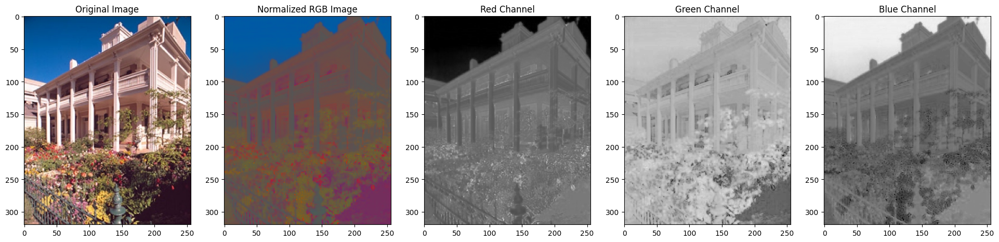

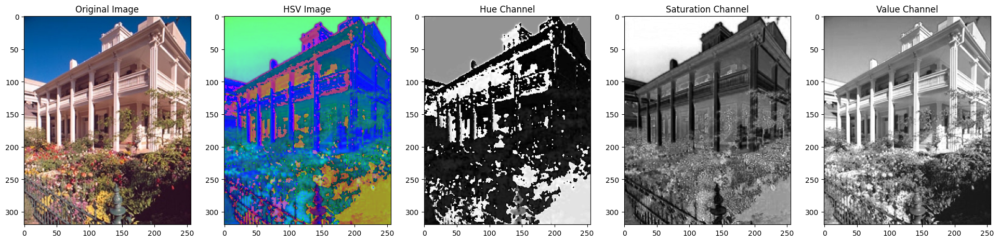

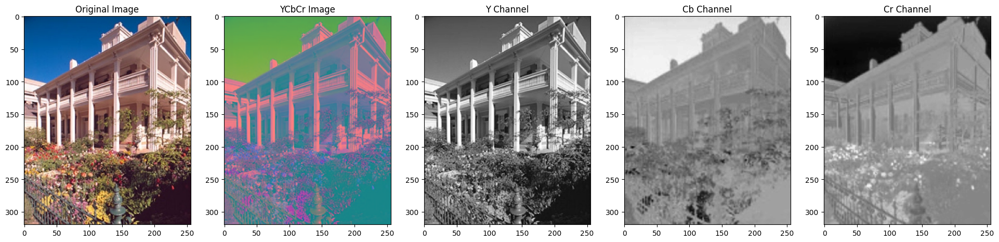

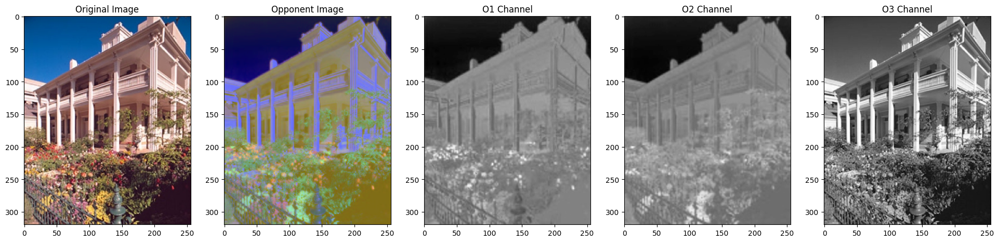

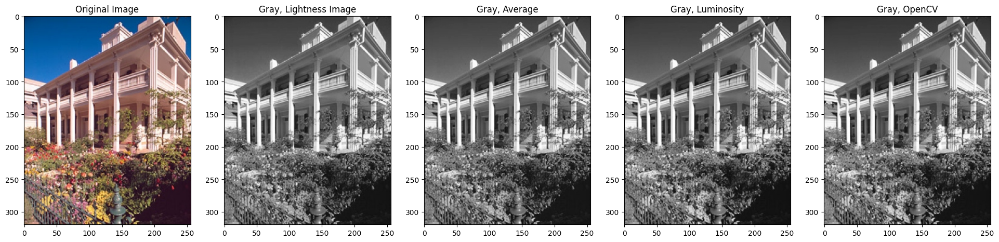

In [6]:
input = cv2.imread('images/awb/awb.jpg')
input = cv2.cvtColor(input, cv2.COLOR_BGR2RGB)
spaces = ['rgb', 'hsv', 'ycbcr', 'opponent', 'gray']
new_images = [ConvertColourSpace(input, x) for x in spaces]
i = 0
for i in range(len(new_images)):
    visualize(input, new_images[i], spaces[i])

### 1.3 Colour Space Properties (2 pts)

Explain each of the above 5 colour spaces and their properties. What are the benefits of using a different colour space other than RGB? Provide reasons for each of the above cases. You can include your observations from the visualizations.

RGB colour space where R stands for red, G for green and B for blue channel. Colors of the picture are produced by combining those three channels. Intensity of each channel ranges between 0 and 255.

HSV is another colour space, where H stands for hue, S for saturation and V for value. Here hue shows the difference in colours, value represents the brightness and saturation represents the purity of the colour. Since hue and value are separated, it can be more convenient for certain tasks, for example, changing the brightness of the image without affecting colour.
Source: Tech-Faq https://www.tech-faq.com/hsv.html


Opponent colour space: this colour space has three components: luminance (brightness) component, red-green channel and blue-yellow channel. These are opposing colours (white-black, red-green, blue-yellow), and according to Hering the way we view colors is based on a system of opposing colors. Since our visual system also process colours in this manner, this colour space has better perception of retaining useful information than RGB. 
Source: C.A.Bouman, “DigitalImageProcessing”; Healthline, “Opponent Process Theory”

In YCbCr colour space Y, which is mostly used in videos. Here L stands for luminance, while Cb stands for blue and Cr for red component related to chroma component. The most important feature of this colour space is that it separates luminance from colour which is also the case for human visual system which is more sensitive to change in brightness than in colour. Since they are separated, luminance can be modified without changing the colour, which makes it better than RGB in this case. 
Source: Dias D., “What is YCbCr? (Color Spaces)”

Gray Colour space represents the image in the 256 shades of grey. It represents the brightness of each pixel, and reduces complexity when colour is not important. When this is the case, grayscale  turns out to be more efficient than RGB colour space.
Source: Sinha U., AI Shack, “Color Spaces”

### 1.4 More on Colour Spaces (1 pt)

Find one more colour space from the literature, briefly explain its properties and give a use case.

CIELAB is another color space. Lab stands for color quantitative relationship of colors on three axes: L* value indicates lightness (from black to white), and a* and b* for the four unique colors of human vision: red, green, blue and yellow. a is for red to green and b is for yellow to blue. The CIELAB color space is perceptually uniform - given numerical change in values corresponds to a similar perceived change in color.

Use case: 

Sharpening using the luminance channel: when the image is converted from RGB to LAB, it gives direct access to a distinct luminance channel, which is needed for sharpening. By focusing the sharpening on just the luminance and not the color channels, the outcome is a much crisper and cleaner sharpened image.

Source: Bao Chau et al. "Research Techniques Made Simple: Cutaneous Colorimetry: A Reliable Technique for Objective Skin Color Measurement", Wikipedia

# 2 Colour Constancy *(15 pts)*

Colour constancy is the ability to perceive colors of objects, invariant to the colour of the light source. The aim for colour constancy algorithms is first to estimate the illuminant of the light source, and then correct the image so that the corrected image appears to be taken under a canonical (white) light source. The task of the automatic white balance (AWB) is to do the same in digital cameras so that the images taken by a digital camera look as natural as possible.

In this part of the assignment, you will implement the most famous colour constancy algorithm; *Grey-World Algorithm*. The algorithm assumes that, under a white light source, the average colour in a scene should be achromatic (grey, [128, 128, 128]).

Specific information on the algorithm can be found on:
https://en.wikipedia.org/wiki/Color_normalization#Grey_world



### 2.1 Grey-World algorithm (8 pts)

Complete the function to apply colour correction to an RGB image by using Grey-World algorithm. Display the original image and the colour corrected one on the same figure. Use awb.jpg image (provided in the downloaded zip-file) to test your algorithm. In the end, you should see that the reddish colour cast on the image is removed and it looks more natural.

  ***Note:*** You do not need to apply any pre or post processing steps. For the calculation or processing, you are not allowed to use any available code or any dedicated library function except *standard Numpy functions*.
   

In [7]:
def grey_world(awb_img):
    
    avg_r = np.mean(awb_img[:, :, 0])
    avg_g = np.mean(awb_img[:, :, 1])
    avg_b = np.mean(awb_img[:, :, 2])
    avg = (avg_r+avg_g+avg_b)/3

    awb_img[:, :, 0] = np.clip(awb_img[:, :, 0] * (avg / avg_r), 0, 255)
    awb_img[:, :, 1] = np.clip(awb_img[:, :, 1] * (avg / avg_g), 0, 255)
    awb_img[:, :, 2] = np.clip(awb_img[:, :, 2] * (avg / avg_b), 0, 255)
    return awb_img

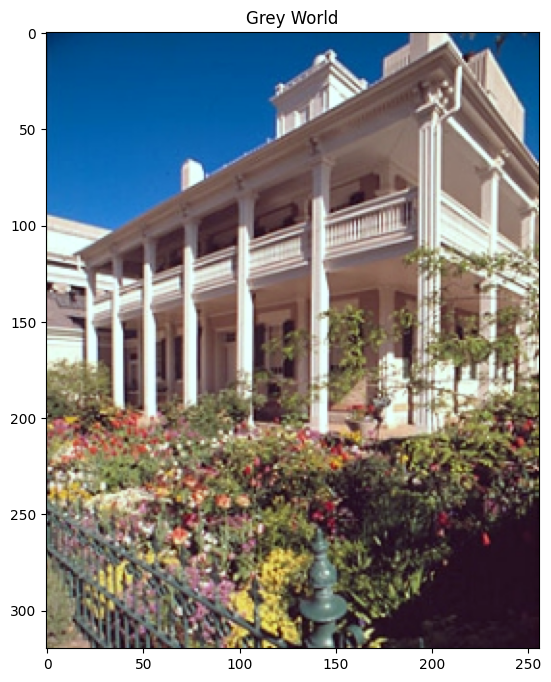

In [8]:
input = cv2.imread('images/awb/awb.jpg')
input = cv2.cvtColor(input, cv2.COLOR_BGR2RGB)

plt.figure(figsize = (16,8))
# plt.subplot(1, 2, 1)
# plt.imshow(input)
# plt.title("Original")

plt.subplot(1, 2, 2) 
plt.title("Grey World")
plt.imshow(grey_world(input))

### 2.2 Limits of Grey-World (2 pts)

Give an example case for Grey-World Algorithm on where it might fail. Include your reasoning.


Grey-world algorithm may fail when one dominant color is essential for the picture. For example, if someone had picture from skiing, where everything is covered in snow, because of the light reflection blue might be the dominant color. Grey world algorithm would compute mean of the colors, and change the picture setting. As a result picture wouldn't look cold anymore which would completely change the mood of the photo.

### 2.3 Other Constancy algorithms (5 pts)

Find out one more colour constancy algorithm from the literature and explain it briefly.


Scale by Max algorithm is another color constancy algorithm similar to Grey world algorithm. It determines the illuminant estimation by identifying the maximum response in each of the R, G, and B channels.  Unlike GW algorithm which computes the mean of the sensor response in each channel, scale by max uses the maximum of the sensor responses in each chanel. 
Source:  V. Agarwal, et al., "An Overview of Color Constancy Algorithms"

# 3 Intrinsic Image Decomposition *(12 pts)*


Intrinsic image decomposition is the process of separating an image into its formation components, such as reflectance (albedo) and shading (illumination). <a name="cite_ref-1"></a>[<sup>[1]</sup>](#cite_note-1) Then, under the assumptions of body (diffuse) reflection, linear sensor response and narrow band filters, the decomposition of the observed image $I(\vec{x})$ at position $\vec{x}$ can be approximated as the element-wise product of its albedo $R(\vec{x})$ and shading $S(\vec{x})$ intrinsics:

$$I(\vec{x})=R(\vec{x}) \times S(\vec{x})$$

In this part of the assignment, you will experiment with intrinsic image components to perform a particular computational photography applications: material recolouring. For the experiments, we will use images from a synthetic intrinsic image dataset. <a name="cite_ref-2"></a>[<sup>[2]</sup>](#cite_note-2)

<a name="cite_note-1"></a><small>1. [^](#cite_ref-1) H. G. Barrow and J. M. Tenenbaum. Recovering intrinsic scene characteristics from images. Computer Vision Systems, pages 3-26, 1978.</small>

<a name="cite_note-2"></a><small>2. [^](#cite_ref-1) http://www.cic.uab.cat/Datasets/synthetic_intrinsic_image_dataset/



### 3.1 Image decomposition *(2 pts)*

In what other components can an image be decomposed other than albedo and shading? Give an example and explain the concepts in your answer.

Image can also be decomposed in depth. By decomposing the photo in depth each pixel would get the corresponding depth value, which would make it easier to determine which objects are closer and which are further. This image decomposition is especially useful in autonomous driving, robot autonomous navigation and object recognition. 

Source: Zhao, L., et al., “From Deep Image Decomposition to Single Depth Image Super-Resolution”

There is also a method that handles specularity. It first removes specularities from the photo and then decomposes the image into shading and reflectance components. Sometimes t is useful to separate shiny parts from the rest of the image, to better recognise the content. Also, with analysing specularity, light sources can be determined.

Source: Muhammad, S., “Handling Specularity in Intrinsic Image Decomposition”

### 3.2 Synthetic data *(2 pts)*

If you check the literature, you will see that almost all intrinsic image decomposition datasets are composed of synthetic images. What might be the reason for that?

The reason might be that with synthetic images they can create their own scenarios with unlimited number of objects. They can also remove object reflection and set their own light intensity. They can create a greater amount of different scenarios and test their algorithms better.

### 3.3. Reconstructing *(4 pts)*

Pick a favorite object from the synthetic intrinsic image dataset and store it's original image, shading and reflectance in a new folder in *'./images'*, e.g. *./images/intrinsic_images/* (or choose your own folder and change the path in the code). Show that you can actually reconstruct the original PNG image from its intrinsics using the albedo and shading. In the end, your script should output a figure displaying the original image, its intrinsic images and the reconstructed one. Complete the code for function **iid_image_formation()**.

The auxiliary functions are for opening and visualizing the original and intrinsic images. In your submission, only supply the images of the object you picked.

In [9]:
def iid_image_formation(albedo_img, shading_img):

    iid_img = (albedo_img/255 * shading_img/255)

    return iid_img

ball: (266, 480, 3)
objectShading: (266, 480, 3)
objectAlbedo: (266, 480, 3)


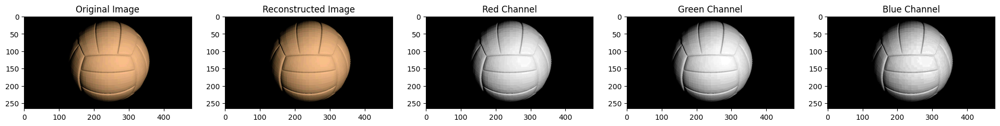

In [10]:
## Replace the image name with a valid image
img_path = './images/intrinsic_images/'
object_name = 'ball'

## Read with opencv
picked_object = cv2.imread(img_path + object_name + '_dl.png')
picked_object = cv2.cvtColor(picked_object, cv2.COLOR_BGR2RGB)
if picked_object is None:
    print('no image found')
else:
    print(object_name + ':', picked_object.shape)

objectShading =  cv2.cvtColor(cv2.imread(img_path + object_name + '_dl_shad.png'), cv2.COLOR_BGR2RGB)
if objectShading is None:
    print('no image found')
else:
    print('objectShading:', objectShading.shape)

objectAlbedo = cv2.cvtColor(cv2.imread(img_path + object_name + '_refl.png'), cv2.COLOR_BGR2RGB)
if objectAlbedo is None:
    print('no image found')
else:
    print('objectAlbedo:', objectAlbedo.shape)


picked_object_IDD = iid_image_formation(objectAlbedo, objectShading)
visualize((picked_object/picked_object.max()*255.).astype(int),
          (picked_object_IDD/picked_object_IDD.max()*255.).astype(int), 'reconstruct')



### 3.4 Recoloring *(4 pts)*


Manipulating colours in photographs is an important problem with many applications in computer vision. Since the aim for recolouring algorithms is just to manipulate colours, better results can be obtained for such a task if the albedo image is available as it is independent of confounding illumination effects.

Assume that you are given the PNG image and you have access to its
intrinsic albedo and shading images.
1. Find out the true material colour of the object you picked in RGB space (which is uniform in this case).
2. Recolour the object's image with pure green (0, 255, 0). Display the original object image and the recoloured version on the same figure. Complete the code for function **recolouring()**.

3. Although you have recoloured the object with pure green, the reconstructed images do not seem to display those pure colors and thus the colour distributions over the object do not appear uniform. Explain the reason.

(266, 480, 3)


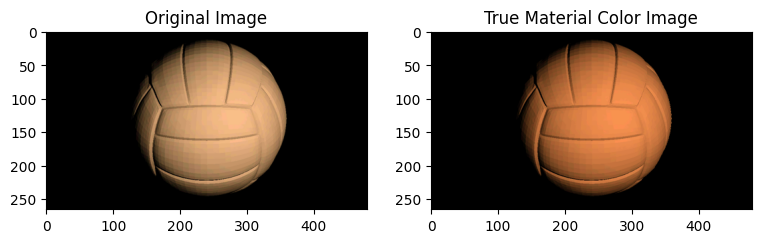

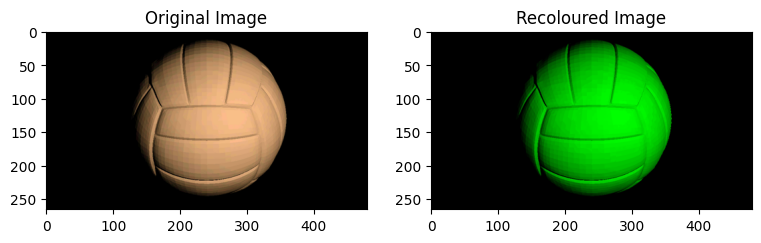

In [11]:
def recolouring(albedo_img, shading_img):

    mean = np.mean(albedo_img, axis = (0, 1))

    recoloured_image = (albedo_img/255  * np.array([0, 1, 0])) * shading_img/255 
    
    true_color = (albedo_img/255  * mean) * shading_img/255 
    
    return true_color, recoloured_image

true_color, picked_object_recolor = recolouring(objectAlbedo, objectShading)

print(true_color.shape)

visualize((picked_object/picked_object.max()*255.).astype(int),
          (true_color/true_color.max()*255.).astype(int),'true_color')
visualize((picked_object/picked_object.max()*255.).astype(int),
          (picked_object_recolor/picked_object_recolor.max()*255.).astype(int),'recolour')



The top figure shows the true material color obtained by taking the mean across all three channels and multiplying it with the albedo

The reason of the colours not being pure green is the shading effect. When changing the colour of the object we are only multiplying by albedo. That is why we see some difference in brightness, too.

__Note:__  this was a simple case where the image is synthetic, object centered and has only one colour, and you have access to its ground-truth intrinsic images. Real world scenarios require more than just replacing a single colour with another, not to mention the complexity of achieving a decent intrinsic image decomposition.

# 4 Photometric Stereo *(60 pts)*



In this part of the assignment, you are going to implement the photometric stereo algorithm as described in Section 5.4 (Forsyth and Ponce, *Computer Vision: A Modern Approach*). The chapter snippet has been included in the assignment zip file.

Following this instruction, you will edit and fill in your code in the procedures below **estimate_alb_nrm()**, **check_integrability()** and **construct_surface()**, that you can find in the codecells below (4.1, 4.2 and 4.3, respectively). The main script **photometric_stereo** (4.4) is provided for reference and should not be taken as is. Throughout the assignment, you will be asked to perform different trials and experiments which will require you to adjust the main code accordingly; this also shows how well you can cope with the materials.

Include images of the results into your notebook at informative points. For 3D models, make sure to choose a viewpoint that makes the structure as clear as possible and/or feel free to take them from multiple viewpoints.

### 4.1 Estimating Albedo and Surface Normal *(15 pts)*
Let us start with the grayscale sphere model, which is located in the SphereGray5 folder. The folder contains 5 images of a sphere with a grayscale checker texture under similar lighting conditions as the one in the book. Your task is to estimate the surface reflectance (albedo) and surface normal of this model. The light source directions are encoded in the image file names.

1. Complete the code for function **estimate_alb_nrm()** to estimate albedo and surface normal map for the SphereGray5 folder. What do you expect to see in albedo image and how is it different from your result?
2. In principle, what is the minimum number of images you need to estimate albedo and surface normal? Run the algorithm with more images by using SphereGray25, observe the differences in the results and report. You could try all images at once or a few at the time, in an incremental fashion. Choose a strategy and justify it by discussing your results.
3. What is the impact of shadows in photometric stereo? Explain the trick that is used in the text to deal with shadows. Remove that trick from your implementation and check your results. Is the trick necessary in the case of 5 images? how about 25 images?

An answer box can be found below the code cells.

**Hint**: To get the least-squares solution of a linear system, you can use **numpy.linalg.lstsq** function.

In [12]:
# Helper functions to load the synthetic images

def load_syn_images(image_dir='./images/photometrics_images/SphereGray5/', channel=0):
    files = os.listdir(image_dir)
    nfiles = len(files)

    image_stack = None
    V = 0
    Z = 0.5

    for i in range(nfiles):
        # read input image
        im = cv2.imread(os.path.join(image_dir, files[i]))
        im = np.flip(im, axis=-1)
        im = im[:,:,channel]

        # stack at third dimension
        if image_stack is None:
            h, w = im.shape
            print('Image size (H*W): %d*%d' %(h,w) )
            image_stack = np.zeros([h, w, nfiles], dtype=int)
            V = np.zeros([nfiles, 3], dtype=np.float64)

        image_stack[:,:,i] = im

        # read light direction from image name
        X = np.double(files[i][(files[i].find('_')+1):files[i].rfind('_')])
        Y = np.double(files[i][files[i].rfind('_')+1:files[i].rfind('.png')])
        V[i, :] = [-X, Y, Z]

    # normalization
    image_stack = np.double(image_stack)
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    image_stack = (image_stack - min_val) / (max_val - min_val) if max_val!=min_val else np.zeros(image_stack.shape)  # avoid fail when image_stack==0
    normV = np.tile(np.sqrt(np.sum(V ** 2, axis=1, keepdims=True)), (1, V.shape[1]))
    scriptV = V / normV

    return image_stack, scriptV

In [13]:
## Helper function for showing results.

def show_results(albedo, normals, height_map=None, SE=None):
    # Stride in the plot, you may want to adjust it to different images
    stride = 1

    if albedo is not None:
        # showing albedo map
        fig = plt.figure()
        #albedo_max = albedo.max()
        albedo_max = 1
        albedo = albedo / albedo_max
        print(albedo.shape)
        plt.imshow(albedo, cmap="gray")
        plt.show()

    # showing normals as three separate channels
    figure = plt.figure()
    ax1 = figure.add_subplot(131)
    ax1.imshow(normals[..., 0])
    ax2 = figure.add_subplot(132)
    ax2.imshow(normals[..., 1])
    ax3 = figure.add_subplot(133)
    ax3.imshow(normals[..., 2])   
    plt.show()

    # meshgrid
    X, Y, _ = np.meshgrid(np.arange(0,np.shape(normals)[0], stride),
    np.arange(0,np.shape(normals)[1], stride),
    np.arange(1))
    X = X[..., 0]
    Y = Y[..., 0]

    '''
    =============
    You could further inspect the shape of the objects and normal directions by using plt.quiver() function.
    =============
    '''

    if height_map is not None:
      # plotting model geometry
      H = height_map[::stride,::stride]
      fig = plt.figure()
      ax = fig.gca(projection='3d')
      ax.plot_surface(X,Y, H.T)
      plt.show()

    if SE is not None:
      # plotting the SE
      H = SE[::stride,::stride]
      fig = plt.figure()
      ax = fig.gca(projection='3d')
      ax.plot_surface(X,Y, H.T)
      plt.show()

In [14]:
def estimate_alb_nrm(image_stack, scriptV, shadow_trick=True):
    '''
    Compute the gradient of the surface
    INPUT:
        - image_stack : the images of the desired surface stacked up on the 3rd dimension
        - scriptV : matrix V (in the algorithm) of source and camera information
        - shadow_trick: (true/false) whether or not to use shadow trick in solving linear equations
    OUTPUT:
        - albedo : the surface albedo
        - normal : the surface normal
    '''
        
    h, w, _ = image_stack.shape

    # create arrays for
    # albedo (1 channel)
    # normal (3 channels)
    albedo = np.zeros([h, w])
    normal = np.zeros([h, w, 3])
    # ================
    # YOUR CODE HERE
    #
    # for each point in the image array
    for i in range(h):
        for j in range(w):
    #       stack image values into a vector i
            value_stack = image_stack[i][j]

    #       construct the diagonal matrix scriptI
            diag = np.zeros((len(value_stack),len(value_stack)))

            

            np.fill_diagonal(diag, value_stack)
    #       solve scriptI * scriptV * g = scriptI * i to obtain g for this point
            if shadow_trick == True:
                g = np.linalg.lstsq(diag @ scriptV, diag @ value_stack, rcond=None)[0]
            if shadow_trick == False:
                g = np.linalg.lstsq(scriptV, value_stack, rcond=None)[0]


#     #     albedo at this point is |g|
            albedo[i][j] = np.linalg.norm(g)
#     #     normal at this point is g / |g|
            normal[i][j] = g / np.linalg.norm(g)
            
#     # ================
    return albedo, normal



Image size (H*W): 512*512


C:\Users\Juell\AppData\Local\Temp\ipykernel_24892\2989524999.py:45: RuntimeWarning: invalid value encountered in true_divide
  normal[i][j] = g / np.linalg.norm(g)


(512, 512)


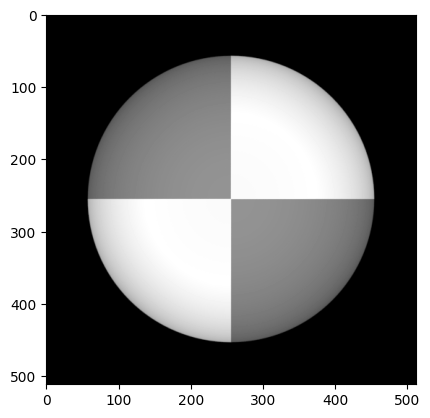

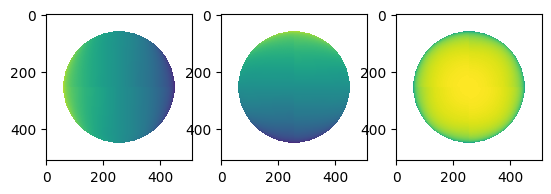

(512, 512)


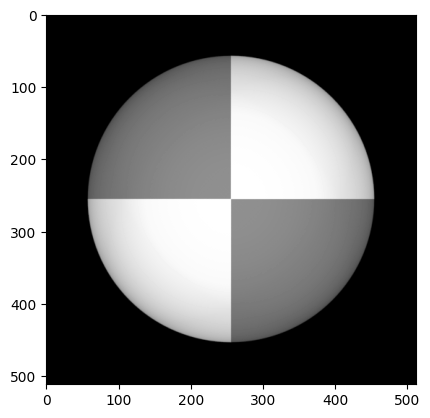

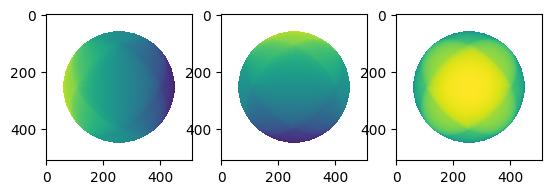

In [15]:
# load syn images
image_stack_5, scriptV_5 = load_syn_images()

# estimate_alb_nrm
albedo_5, normals_5 = estimate_alb_nrm(image_stack_5, scriptV_5, True)
albedo_5_notrick, normals_5_notrick = estimate_alb_nrm(image_stack_5, scriptV_5, False)

# Show results
show_results(albedo_5, normals_5)
show_results(albedo_5_notrick, normals_5_notrick)

Image size (H*W): 512*512


C:\Users\Juell\AppData\Local\Temp\ipykernel_24892\2989524999.py:45: RuntimeWarning: invalid value encountered in true_divide
  normal[i][j] = g / np.linalg.norm(g)


(512, 512)


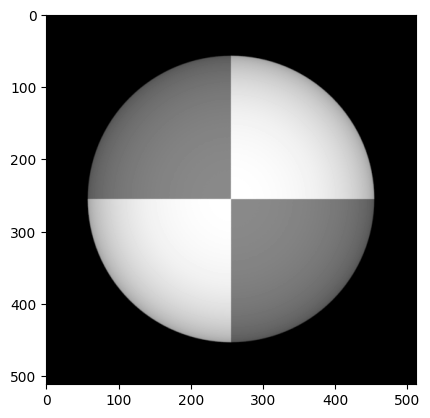

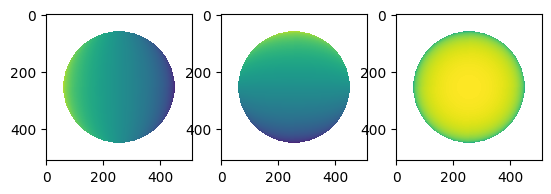

(512, 512)


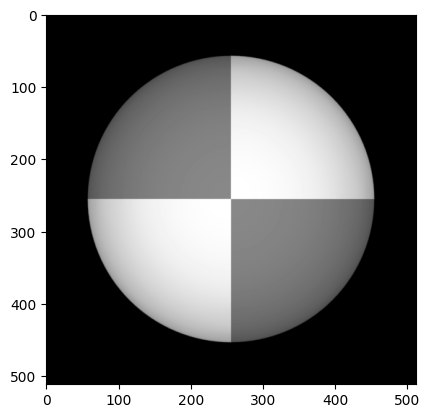

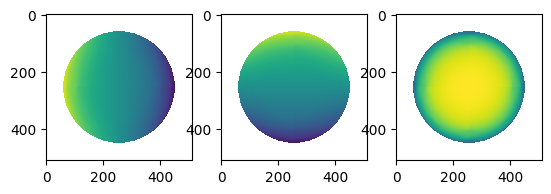

In [16]:
# load syn images
image_stack_25, scriptV_25 = load_syn_images(image_dir='./images/photometrics_images/SphereGray25/')

# estimate_alb_nrm
albedo_25, normals_25 = estimate_alb_nrm(image_stack_25, scriptV_25, True)
albedo_25_notrick, normals_25_notrick = estimate_alb_nrm(image_stack_25, scriptV_25, False)

# Show results
show_results(albedo_25, normals_25)
show_results(albedo_25_notrick, normals_25_notrick)

1. We expect to see the albedo image to contain no shading from estimating the albedo and surface normal. As a result from the algorithm there is little shading visible, however the shape of the circle is completely visible.

2. Surface normal is 3 dimensional vector, and therefore we would need minimum of three images to estimate albedo and surface normal- one equation for each of the three unknowns. With the greater number of images, as we can see in the second plot, we get the better representation of the albedo and surface normal.
3. Shadows can cover some parts of the images, not enabling us to see the full picture. To solve that issue we can use the following trick: If there's no ambient light, we can use a matrix made from the image vector. By multiplying with this matrix, we can eliminate any data from shadowed points.
Without the trick there are more shadows in the images and the brightness is lower. However, this difference in brightness with or without the trick is more difficult to recognize when estimating with 25 images.

### 4.2 Test of Integrability *(10 pts)*



Before we can reconstruct the surface height map, it is required to compute the partial derivatives $\frac{\delta f}{\delta x}$ and $\frac{\delta f}{\delta y}$ (or *p* and *q* in the algorithm). The partial derivatives also give us a chance to double check our computation, namely the test of *integrability*.

#### 4.2.1. Compute the partial derivatives (p and q in the algorithm) by filling in your code into **check_integrability()** (5 pts).

In [17]:
def check_integrability(normals):
    '''
    Check the surface gradient is acceptable
    INPUTS:
        - normals: normal image
    OUTPUTS:
        - p : df / dx
        - q : df / dy
        - SE : Squared Errors of the 2 second derivatives
    '''

    # initalization
    p = np.zeros(normals.shape[:2])
    q = np.zeros(normals.shape[:2])
    SE = np.zeros(normals.shape[:2])

    # ================
    p = normals[:, :, 0] / normals[:, :, 2]
    q = normals[:, :, 1] / normals[:, :, 2]
    # ================
    # Compute p and q, where
    # p measures value of df / dx
    # q measures value of df / dy

    # change nan to 0
    p[p!=p] = 0
    q[q!=q] = 0
    # ================
    SE = (np.gradient(p, axis=1) - np.gradient(q, axis=0))**2
    # approximate second derivate by neighbor difference
    # and compute the Squared Errors SE of the 2 second derivatives SE
    # ================

    return p, q, SE

# Use the normals that you found in the previous question
p_5_t, q_5_t, SE_5_t = check_integrability(normals_5)
p_5, q_5, SE_5 = check_integrability(normals_5_notrick)
p_25_t, q_25_t, SE_25_t = check_integrability(normals_25)
p_25, q_25, SE_25 = check_integrability(normals_25_notrick)
print('For 5 images, with using shadow trick, SE:', SE_5_t.shape, SE_5_t.max())
print('For 5 images, without using shadow trick, SE:', SE_5.shape, SE_5.max())
print('For 25 images, with using shadow trick, SE:', SE_25_t.shape, SE_25_t.max())
print('For 25 images, without using shadow trick, SE:', SE_25.shape, SE_25.max())

For 5 images, with using shadow trick, SE: (512, 512) 1.265625000000003
For 5 images, without using shadow trick, SE: (512, 512) 0.2749815119772543
For 25 images, with using shadow trick, SE: (512, 512) 0.879621680015529
For 25 images, without using shadow trick, SE: (512, 512) 0.21890039316732388


#### 4.2.2. Second derivatives (5 pts)

Implement and compute the second derivatives according to the algorithm and perform the test of integrability by choosing a reasonable threshold. What could be the reasons for the errors? How does the test perform with different numbers of images used in the reconstruction process in 4.1?

When choosing a threshold of 1.00, only using the shadow trick and having 5 images lies above this threshold and thus has the highest error of all tests.

As this test checks if the mixed second partials are equal, small errors can occur since we have to estimate the partial derivatives numerically. This estimation will cause very small differences in the values, which causes these small errors.

The more images are used, the lower the squared error between the two partial derivatives, with the lowest error using 25 images.

### 4.3 Shape by Integration *(15 pts)*  
To reconstruct the surface height map, we need to continuously integrate the partial derivatives over a path. However, as we are working with discrete structures, you will be simply summing their values.

The algorithm in the chapter presents a way to do the integration in column-major order, that is you start at the top-left corner and integrate along the first column, then go towards the right along each row. Yet, it is also noticed that it would be better to use many different paths and average so as to spread around the errors in the derivative estimates.

#### 4.3.1. Construct the surface height map (7 pts)

Construct the surface height map using column-major order as described in the algorithm, then implement row-major path integration. Your code should go in **construct_surface()**.

**Note**: By default, Numpy used row-major operations. So if you are unrolling an image to linearize the operation, you will end up with a row-major representation. Numpy can be configured to be column-major. Otherwise, if you are using the double for-loops without an unrolling operation, then this concern doesn’t apply.

**Hint**: You could further inspect the shape of the objects and normal directions by using **matplotlib.pyplot.quiver** function. You will have to choose appropriate sub-sampling ratios for proper illustration. You code goes to the **show_results()** function in the code cell above.

Without using the shadow trick, 5 images for SphereGray and row path results in the following surface height map: 
p: (512, 512) q: (512, 512) 0.8937500000000003
Row path: 
(512, 512)


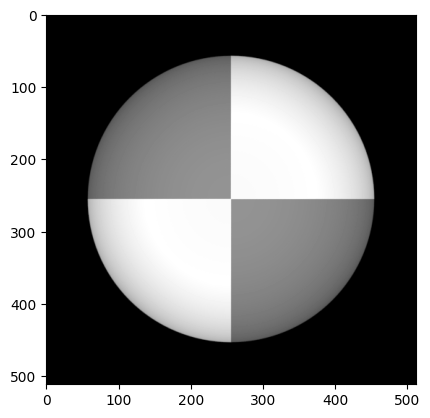

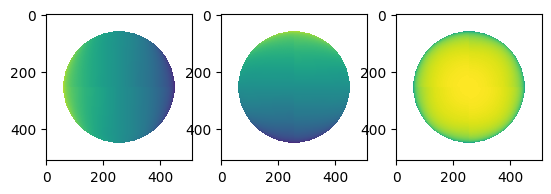

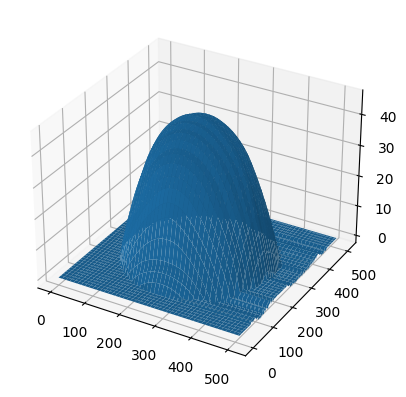

Without using the shadow trick and 5 images for SphereGray and column path results in the following surface height map: 
p: (512, 512) q: (512, 512) 0.8937500000000003
Row path: 
(512, 512)


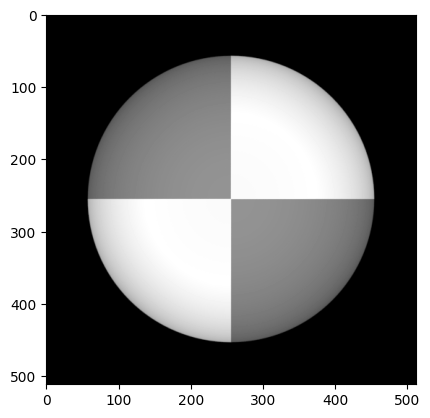

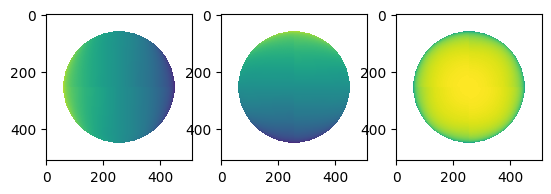

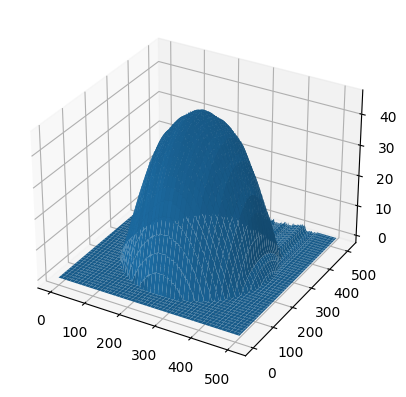

Without using the shadow trick and 5 images for SphereGray and average path results in the following surface height map: 
p: (512, 512) q: (512, 512) 0.8937500000000003
Row path: 
(512, 512)


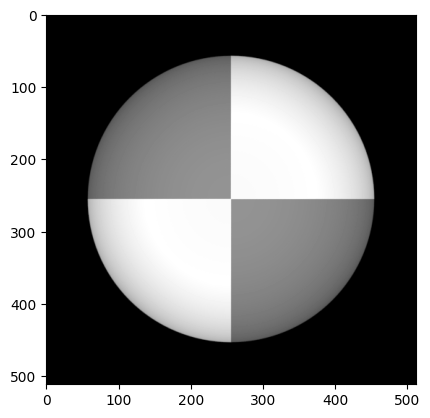

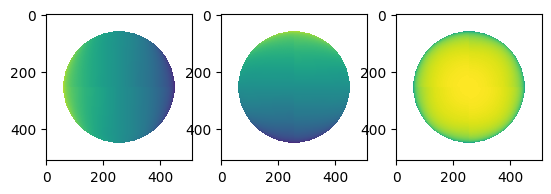

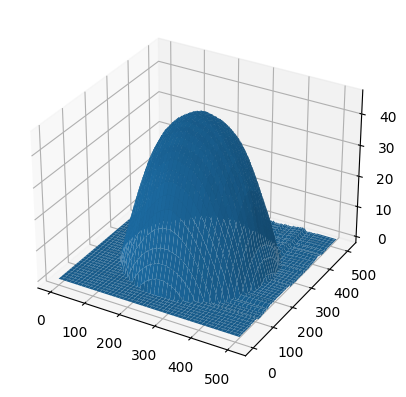

In [18]:
def construct_surface(p, q, path_type='column'):
    '''
    Construct the surface function represented as height_map
    INPUT:
       - p : measures value of df / dx
       - q : measures value of df / dy
       - path_type: type of path to construct height_map, either 'column',
         'row', or 'average'
    OUTPUT:
       - height_map: the reconstructed surface
    '''

    h, w = p.shape
    height_map = np.zeros([h, w])

    if path_type=='column':
        # ================
        # YOUR CODE HERE
        # ================
        # top left corner of height_map is zero
        # for each pixel in the left column of height_map
        #  height_value = previous_height_value + corresponding_q_value
                # for each row
        #   for each element of the row except for leftmost
        #       height_value = previous_height_value + corresponding_p_value

        for i in range(w):
            for j in range(h):
                if i + j == 0:
                    continue
                elif i == 0:
                    height_map[j, i] = q[j, i] + height_map[j - 1, i]
                else:
                    height_map[j, i] = p[j, i] + height_map[j, i - 1]

    elif path_type=='row':
        for i in range(h):
            for j in range(w):
                if i + j == 0:
                    continue
                elif i == 0:
                    height_map[i, j] = p[i, j] + height_map[i, j - 1]
                else:
                    height_map[i, j] = q[i, j] + height_map[i - 1, j]


    elif path_type == 'average':
        height_map = (construct_surface(p, q, path_type='column') + construct_surface(p, q, path_type='row')) / 2

    return height_map
print("Without using the shadow trick, 5 images for SphereGray and row path results in the following surface height map: ")
print('p:', p_5.shape, 'q:', q_5.shape, q_5.max())
print("Row path: ")
height_map = construct_surface(p_5, q_5, 'row')
show_results(albedo_5, normals_5, height_map)

print("Without using the shadow trick and 5 images for SphereGray and column path results in the following surface height map: ")
print('p:', p_5.shape, 'q:', q_5.shape, q_5.max())
print("Row path: ")
height_map = construct_surface(p_5, q_5, 'column')
show_results(albedo_5, normals_5, height_map)

print("Without using the shadow trick and 5 images for SphereGray and average path results in the following surface height map: ")
print('p:', p_5.shape, 'q:', q_5.shape, q_5.max())
print("Row path: ")
height_map = construct_surface(p_5, q_5, 'average')
show_results(albedo_5, normals_5, height_map)

Above, the height map using row path, column path and average path are plotted.

The following cell plots the height maps again, using 25 images instead of 5:

Without using the shadow trick, 25 images for SphereGray and row path results in the following surface height map: 
p: (512, 512) q: (512, 512) 0.9357358455618207
Row path: 
(512, 512)


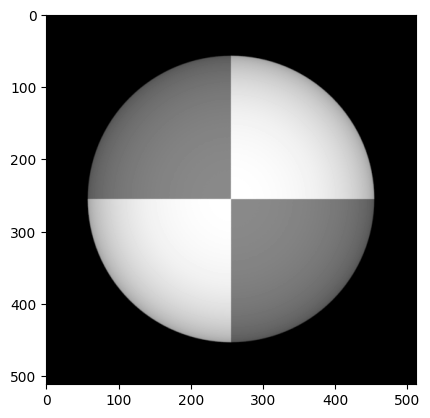

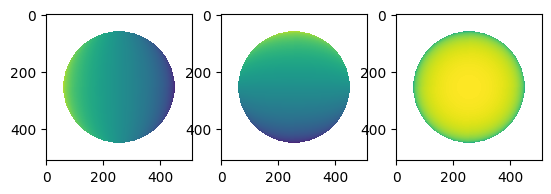

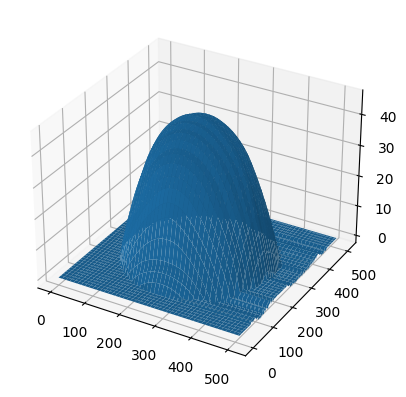

Without using the shadow trick and 25 images for SphereGray and column path results in the following surface height map: 
p: (512, 512) q: (512, 512) 0.9357358455618207
Row path: 
(512, 512)


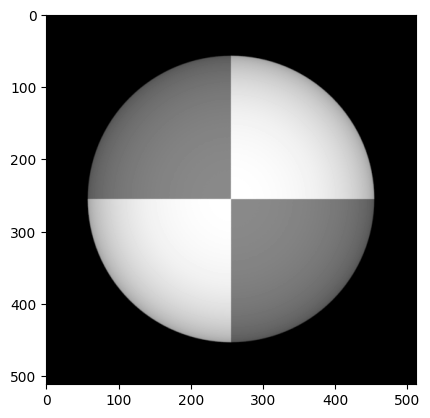

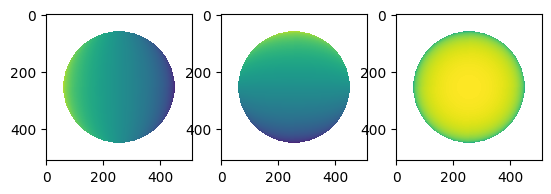

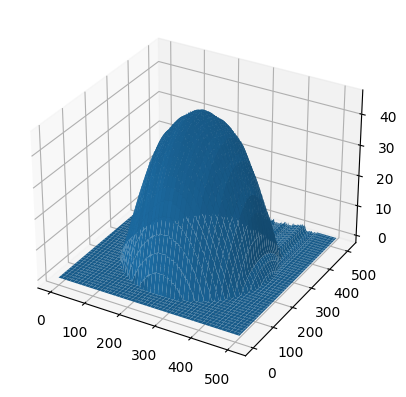

Without using the shadow trick and 25 images for SphereGray and average path results in the following surface height map: 
p: (512, 512) q: (512, 512) 0.9357358455618207
Row path: 
(512, 512)


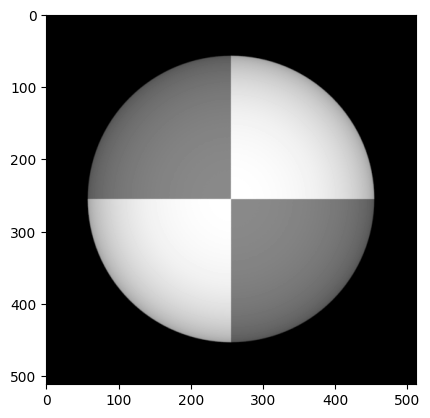

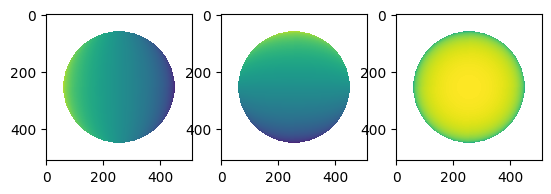

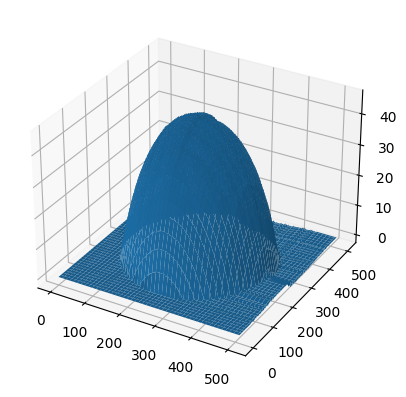

In [19]:
print("Without using the shadow trick, 25 images for SphereGray and row path results in the following surface height map: ")
print('p:', p_25.shape, 'q:', q_25.shape, q_25.max())
print("Row path: ")
height_map = construct_surface(p_5, q_5, 'row')
show_results(albedo_25, normals_25, height_map)

print("Without using the shadow trick and 25 images for SphereGray and column path results in the following surface height map: ")
print('p:', p_25.shape, 'q:', q_25.shape, q_25.max())
print("Row path: ")
height_map = construct_surface(p_5, q_5, 'column')
show_results(albedo_25, normals_25, height_map)

print("Without using the shadow trick and 25 images for SphereGray and average path results in the following surface height map: ")
print('p:', p_25.shape, 'q:', q_25.shape, q_25.max())
print("Row path: ")
height_map = construct_surface(p_25, q_25, 'average')
show_results(albedo_25, normals_25, height_map)

#### 4.3.2. What are the differences in the results of the two paths? (4 pts)


The main difference is the orientation and direction of the errors that occur in the height map compared to the original image.

#### 4.3.3. Now, take the average of the results. (4 pts)

Do you see any improvement compared to when using only one path? Are the construction results different with different numbers of images being used?

The errors that occur from the previous paths occur on similar orientations and directions, but are instead decreased somewhat.

### 4.4 Experiments with different objects *(20 pts)*
In this part, you will try to run the photometric stereo algorithm in a various number of scenarios to see how well it can be generalized.

#### 4.4.1. Run the algorithm and show the results for the MonkeyGray model. *(5 pts)*

##### 1.a Complete the code below, run the algorithm and show the results

Loading images...

Image size (H*W): 512*512
Finish loading 121 images.

Computing surface albedo and normal map...



C:\Users\Juell\AppData\Local\Temp\ipykernel_24892\2989524999.py:45: RuntimeWarning: invalid value encountered in true_divide
  normal[i][j] = g / np.linalg.norm(g)


Integrability checking

Number of outliers: 133

(512, 512)


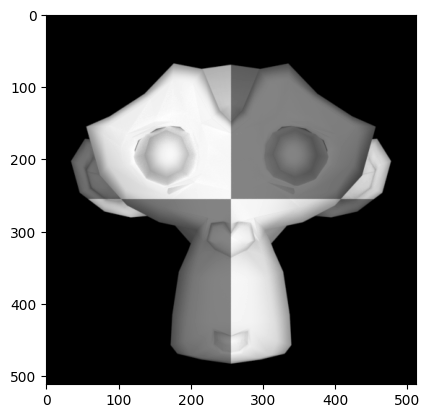

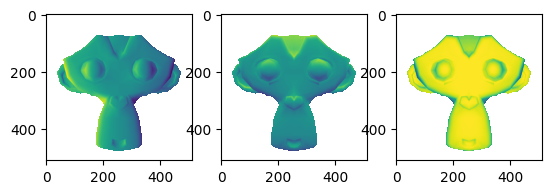

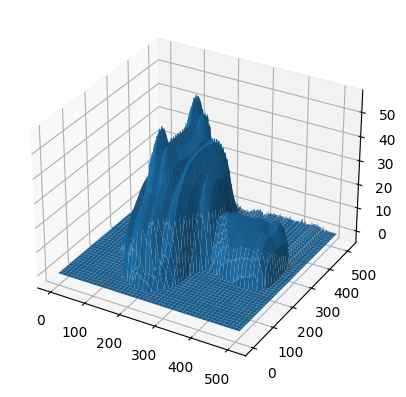

In [20]:
def photometric_stereo(image_dir='./images/photometrics_images/MonkeyGray/'):

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_syn_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface gradient from the stack of imgs and light source mat
    print('Computing surface albedo and normal map...\n')
    # estimate_alb_nrm
    albedo, normals = estimate_alb_nrm(image_stack, scriptV, True)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')
    p, q, SE = check_integrability(normals)

    threshold = 1.0
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan') # for good visualization

    # compute the surface height
    height_map = construct_surface(p, q, 'column')

    # show results
    show_results(albedo, normals, height_map)

# Use the function
image_dir = 'images/photometrics_images/MonkeyGray/'
photometric_stereo(image_dir)

Above, the algorithm is performed on MonkeyGray images, without using the shadow trick, while using the column wise path for height map creation.

##### 1.b Explain errors

The albedo results of the monkey may comprise more albedo errors than in case of the sphere. Observe and describe the errors: Experiment with different cases and observe the errors that arise. (You don't need to calculate and give numerical errors.)

What could be the reason for those errors? You may want to experiment with different numbers of images as you did in Question 1 to see the effects.

In this case, the monkey, the shape is far more complex than the sphere, which would produce more surface normals. In addition, the complicated shape increases the amount of shades within the image.

##### 1.c What do you think could help solving these errors?

Simply increasing the amount of images used would lower the errors that occur in the albedo results. 

#### 4.4.2. Three-channel images. *(5 pts)*

So far, we have assumed that albedos are 1-channel grayscale images and that input images are also 1-channel. To work with 3-channel images, a simple solution is to split the input image into separate channels and treat them individually. Yet, that would generate a small problem while constructing the surface normal map if a pixel value in a channel is zero.


##### 2.a Update the implementation to work for 3-channel RGB inputs and test it with 2 models SphereColor and MonkeyColor.


Loading images...

Image size (H*W): 512*512
Image size (H*W): 512*512
Image size (H*W): 512*512
Finish loading 25 images.

Computing surface albedo and normal map...



C:\Users\Juell\AppData\Local\Temp\ipykernel_24892\2989524999.py:45: RuntimeWarning: invalid value encountered in true_divide
  normal[i][j] = g / np.linalg.norm(g)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Integrability checking

Number of outliers: 0

(512, 512, 3)


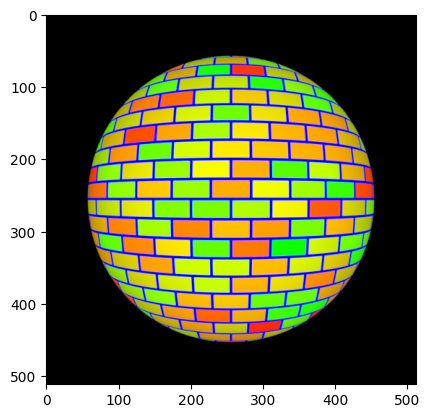

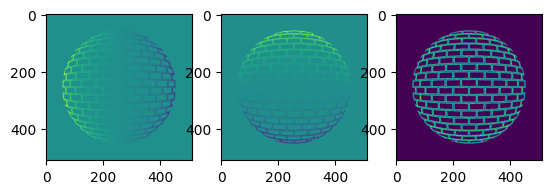

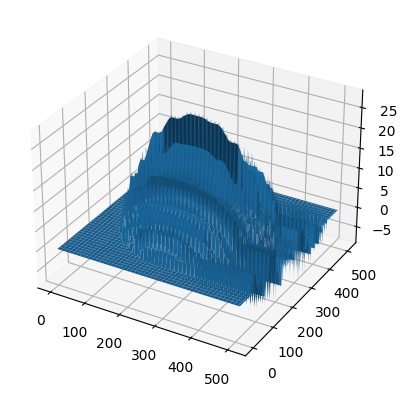

In [21]:
def photometric_stereo_color(image_dir='./images/photometrics_images/MonkeyGray/'):

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack1, scriptV1] = load_syn_images(image_dir, 0)
    [image_stack2, scriptV2] = load_syn_images(image_dir, 1)
    [image_stack3, scriptV3] = load_syn_images(image_dir, 2)
    [h, w, n] = image_stack1.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface gradient from the stack of imgs and light source mat
    print('Computing surface albedo and normal map...\n')
    # estimate_alb_nrm
    albedo1, normals1 = estimate_alb_nrm(image_stack1, scriptV1, True)
    albedo2, normals2 = estimate_alb_nrm(image_stack2, scriptV2, True)
    albedo3, normals3 = estimate_alb_nrm(image_stack3, scriptV3, True)

    albedo = np.stack((albedo1, albedo2, albedo3), axis=-1)
    normals = (normals1 + normals2 + normals3) / 3

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')
    p, q, SE = check_integrability(normals)
    
    normals = np.nan_to_num(normals, nan=0.001)

    threshold = 1
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan') # for good visualization

    # compute the surface height
    height_map = construct_surface(p, q, 'row')

    # show results
    show_results(albedo, normals, height_map)

# Use the function
image_dir = 'images/photometrics_images/SphereColor/'
photometric_stereo_color(image_dir)


##### 2.b Explain your changes and show your results.

To deal with the introduction of RGB channels, each channel is treated seperately for calculating albedo and surface normals, thus generating 3 albedos and 3 surface normals. For albedo, these are then stacked together and plotted as like a regular RGB image. For the surface normals, the average of the three normals is taken and used for calculating the height map and integrability

##### 2.c Observe the problem in the constructed surface normal map and height map. Explain why a zero pixel could be a problem and propose a way to overcome that.

 If there is the operation which is not defined for 0, such as division, and the pixel is 0, then the result would be non-defined.
The problem could be fixed if the small value that wouldn’t much affect the image could be added to each pixel. This value can be significantly small, but as long as it is not equal to 0 it could fix the problem.


#### 4.4.3. Real world dataset A *(5 pts)*   

Now, it's the time to try the algorithm on real-world datasets. For that purpose, we are going the use the Yale Face Database and the Apple dataset.

First the Yale Face Database.

##### 3.a Run the algorithm for the Yale Face images: [Yale Face Database](http://cvc.cs.yale.edu/cvc/projects/yalefaces/yalefaces.html). The Yale face data is included in the lab material.

##### 3.b Observe and discuss the results for different integration paths.

An answer box can be found below the code cells.

**Hint**: For proper computation of albedo and surface normal, you may want to suspend the shadow trick described in the text, and use the original formula:
$$i = Vg(x,y)$$

In [22]:
## help functions for loading Yale Face and Apple images

def load_face_images(image_dir='./images/photometrics_images/yaleB02/'):
    num_images = 64
    filename = os.path.join(image_dir, 'yaleB02_P00_Ambient.pgm')
    ambient_image = cv2.imread(filename, -1)
    h, w = ambient_image.shape

    # get list of all other image files
    import glob
    d = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))
    import random
    d = random.sample(d, num_images)
    filenames = [os.path.basename(x) for x in d]

    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    for j in range(num_images):
        ang[0,j], ang[1,j] = np.double(filenames[j][12:16]), np.double(filenames[j][17:20])
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1) - ambient_image


    x = np.cos(np.pi*ang[1,:]/180) * np.cos(np.pi*ang[0,:]/180)
    y = np.cos(np.pi*ang[1,:]/180) * np.sin(np.pi*ang[0,:]/180)
    z = np.sin(np.pi*ang[1,:]/180)
    scriptV = np.array([y,z,x]).transpose(1,0)

    image_stack = np.double(image_stack)
    image_stack[image_stack<0] = 0
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    image_stack = (image_stack - min_val) / (max_val - min_val) if max_val!=min_val else np.zeros(image_stack.shape)  # avoid fail when image_stack==0

    return image_stack, scriptV


def load_apple_images(image_dir='./images/photometrics_images/Apple'):
    num_images = 99
    filename = os.path.join(image_dir, 'I_0000.png')
    try_image = cv2.imread(filename, -1)
    h, w = try_image[:,:,0].shape

    # get list of all other image files
    import glob
    d = glob.glob(os.path.join(image_dir, 'I_00*.png'))
    import random
    d = random.sample(d, num_images)
    filenames = [os.path.basename(x) for x in d]
    filenames_idx = []
    for i in filenames:
        filenames_idx.append(int(i.split('_')[1].split('.')[0]))

    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    for j in range(num_images):
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1)[:,:,2]

    with open('./images/photometrics_images/Apple/light_directions_refined.txt') as file:
        lines = [line.split() for line in file]
        x, y, z = [], [], []
        for idx in filenames_idx:
            x.append(float(lines[idx][0]))
            y.append(float(lines[idx][1]))
            z.append(float(lines[idx][2]))

    scriptV = [-1,1,1] * np.array([x,y,z]).transpose(1,0)

    image_stack = np.double(image_stack)
    image_stack[image_stack<0] = 0
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    image_stack = (image_stack - min_val) / (max_val - min_val) if max_val!=min_val else np.zeros(image_stack.shape)  # avoid fail when image_stack==0

    return image_stack, scriptV




In [23]:
'''
For each of Face and Apple, you should:
- Load the images
- Compute the surface albedo and normal map
- Run the integrability check
- Find the number of outliers
- Compute the surface albedo and normal mape surface height
- Show the results
'''

## Face
def photometric_stereo_face(image_dir='./images/photometrics_images/yaleB02/', path_type='row'):
    [image_stack, scriptV] = load_face_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)
    # Compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')
    # YOUR CODE HERE
    albedo, normals = estimate_alb_nrm(image_stack, scriptV, False)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking')
    # YOUR CODE HERE
    p, q, SE = check_integrability(normals)

    # YOUR CODE HERE
    threshold = 1
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan') # for good visualization

    # YOUR CODE HERE
    # compute the surface height
    height_map = construct_surface(p, q, path_type)

    # show results
    # YOUR CODE HERE
    show_results(albedo, normals, height_map)

    

## Apple
def photometric_stereo_apple(image_dir='./images/photometrics_images/Apple/', path_type='average'):
    [image_stack, scriptV] = load_apple_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)
    # Compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')
    # YOUR CODE HERE
    albedo, normals = estimate_alb_nrm(image_stack, scriptV, False)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking')
    # YOUR CODE HERE
    p, q, SE = check_integrability(normals)

    # YOUR CODE HERE
    threshold = 0.05
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan') # for good visualization

    # YOUR CODE HERE
    # compute the surface height
    height_map = construct_surface(p, q, path_type)

    # show results
    # YOUR CODE HERE
    show_results(albedo, normals, height_map)

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking
Number of outliers: 4

(192, 168)


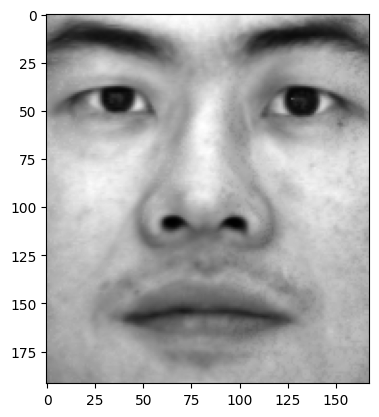

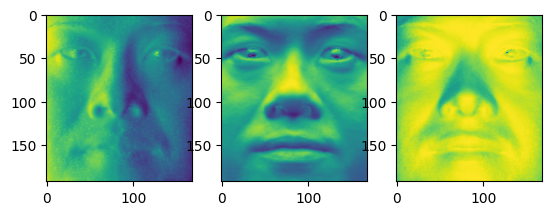

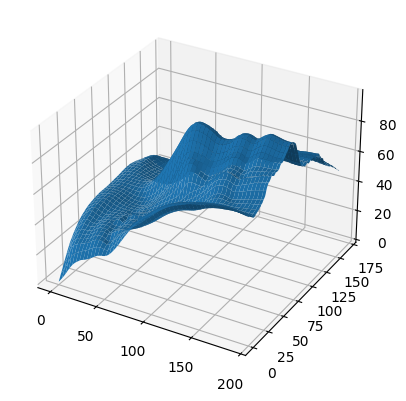

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking
Number of outliers: 4

(192, 168)


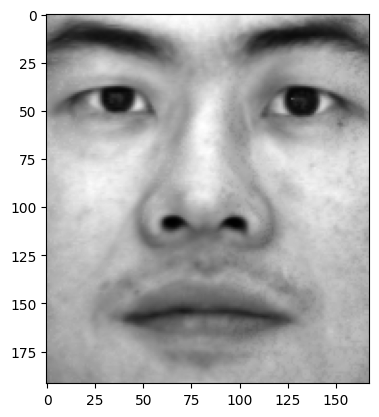

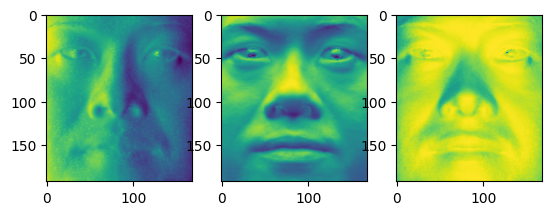

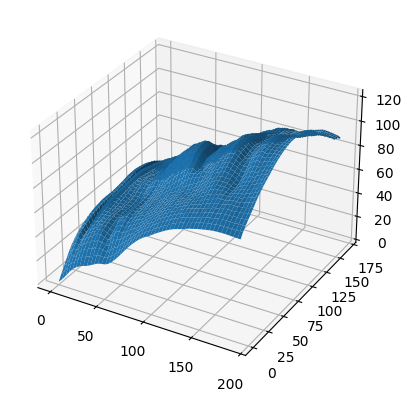

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking
Number of outliers: 4

(192, 168)


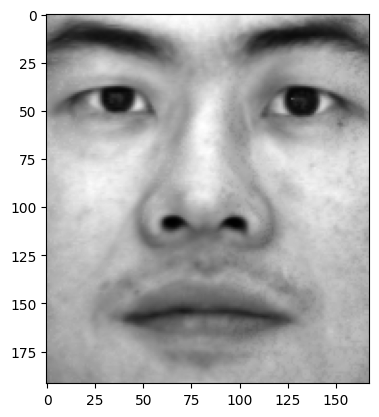

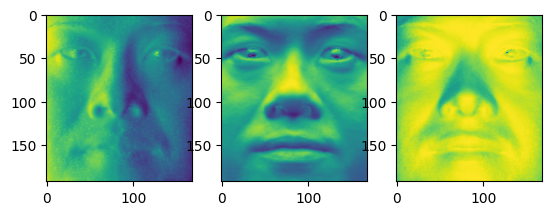

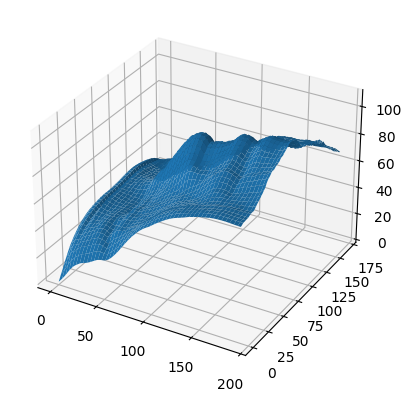

In [24]:
photometric_stereo_face(path_type='row')
photometric_stereo_face(path_type='column')
photometric_stereo_face(path_type='average')

While all integration paths show various depths within the height maps, the row pathing and column pathing both show distinct human features present in the provided images, such as the nose for row pathing and the eyes for column pathing. Average pathing, while aiming to minimize the errors between the partial derivatives, loses some of the human face recognition. Furthermore, surface normals show little difference across pathing options.

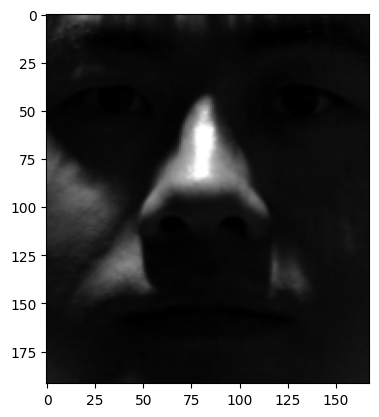

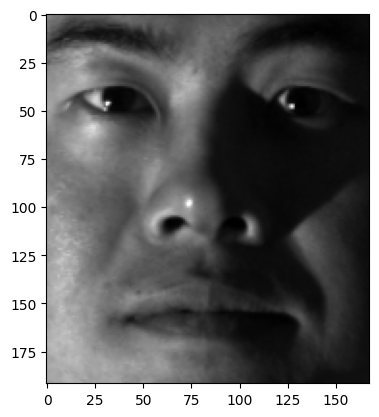

In [25]:
i= cv2.imread('images/photometrics_images/yaleB02/yaleB02_P00A+000E+90.pgm', -1)
plt.imshow(i, cmap='gray')
plt.show()

i= cv2.imread('images/photometrics_images/yaleB02/yaleB02_P00A+060E-20.pgm', -1)
plt.imshow(i, cmap='gray')
plt.show()

##### 3.c Discuss how the images violate the assumptions of the shape-from-shading methods. Remember to include specific input images to illustrate your points.


Previously, these methods would assume a single light source point across the various images, while the images from the Yale Face seem to have more than one light source used. Above, 2 images used in the method are shown, each with a different light source.

##### 3.d How would the results improve when the problematic images are all removed? Try it out and show the results in your notebook.

*Write your answer here*

#### 4.4.4. Real world dataset B (5 pts).  

And finally, the Apple dataset. Show your results on real-world 3-channel RGB inputs, contained in the "Apple" folder, taken from [this dataset](http://vision.ucsd.edu/~nalldrin/research/cvpr08/datasets/) from the University of California San Diego.   

Observe and discuss the results for different integration paths. You may find difficulties in using this non-sythetic dataset. Try if filtering may help.

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking
Number of outliers: 5665

(696, 646)


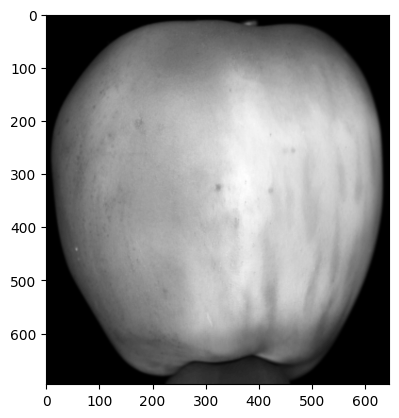

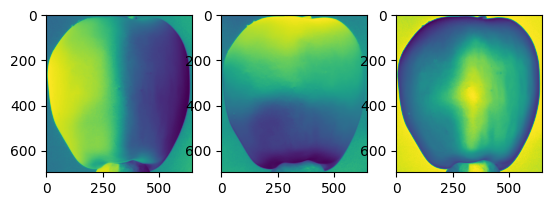

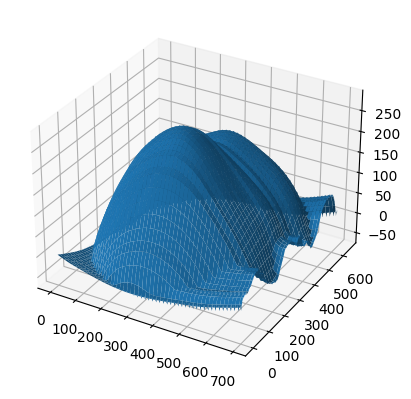

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking
Number of outliers: 5665

(696, 646)


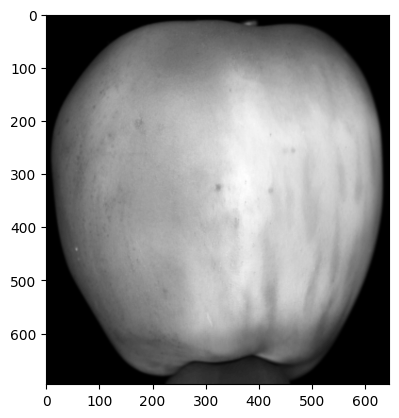

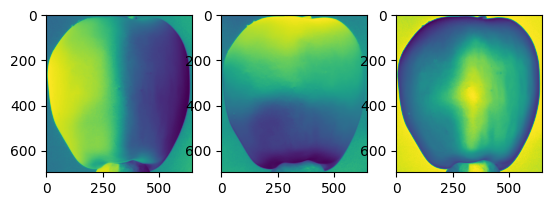

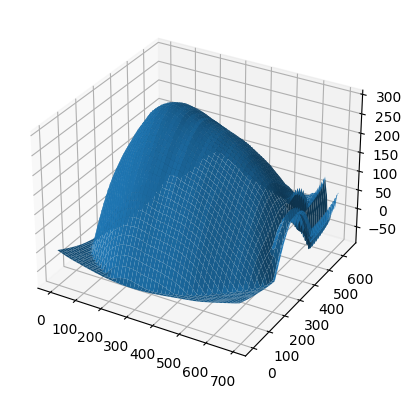

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking
Number of outliers: 5665

(696, 646)


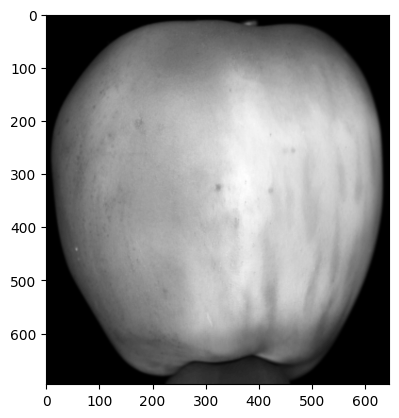

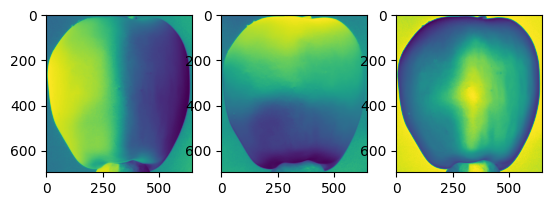

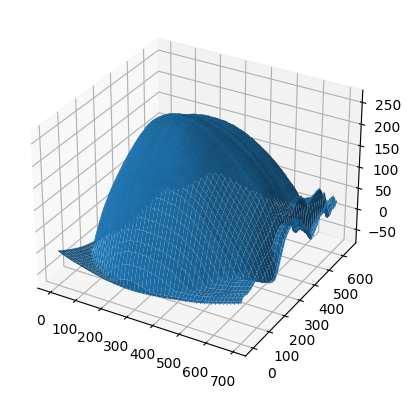

In [26]:
photometric_stereo_apple(path_type='row')
photometric_stereo_apple(path_type='column')
photometric_stereo_apple(path_type='average')

As observed from the height map obtained from the algorithm, the 'row' integration path results in a height map with an inaccurate shape, despite little difference between the plotted albedos and surface normals of the various integration paths. The 'column' integration path has less issues With the round shape compared to the 'row' integration path, but instead has issues with shape of the top of the apple. Both of these inaccuracies can be assigned to the direction of the paths. When looking at the average of the two paths instead, the height map shows an accurate representation of the apple, closely resembling the shape of an ordinary apple.

# X Individual Contribution Report *(Mandatory)*

Because we want each student to contribute fairly to the submitted work, we ask you to fill out the textcells below. Write down your contribution to each of the assignment components in percentages. Naturally, percentages for one particular component should add up to 100% (e.g. 30% - 30% - 40%). No further explanation has to be given.


Name:Juell Sprott

Contribution on research: 50% \
Contribution on programming: 50% \
Contribution on writing: 50%

Name: Mina Janicijevic

Contribution on research: 50%\
Contribution on programming: 50% \
Contribution on writing: 50%

Name:

Contribution on research: \
Contribution on programming: \
Contribution on writing:

( Name:

Contribution on research: \
Contribution on programming: \
Contribution on writing: )

# -End of Notebook-